In [20]:

import glob
import os
import shutil

images_dir = r'C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train'
labels_dir = images_dir.replace("images", "labels")
images = sorted(glob.glob(os.path.join(images_dir, '*.jpg'), recursive=True))

labels = set(sorted(glob.glob(os.path.join(labels_dir, '*.txt'), recursive=True)))

selected_labels_dir = images_dir.replace("cleaned", "selected").replace("images", "labels")

missing_labels = []
backfilled_labels = []
for i in images:
    expeceted_label_file = i.replace("images", "labels").replace("jpg", "txt")
    if expeceted_label_file not in labels:
        missing_labels.append(expeceted_label_file)
        missed_label_name = os.path.basename(i).replace("jpg", "txt")
        found_label_from_selected = os.path.join(selected_labels_dir.replace("shared_009_selected", "shared_007"), missed_label_name)
        if os.path.exists(found_label_from_selected):
            backfilled_labels.append(found_label_from_selected)
            if not os.path.exists(expeceted_label_file):
                shutil.copy(found_label_from_selected, expeceted_label_file)
        
        
print("Found labels", len(backfilled_labels))
print(len(missing_labels) , len(labels), len(images))
    
    

Found labels 0
6 6115 6121


### Data Copy shared_009_cleaned

In [191]:
import os
import shutil
import glob
import random

# Paths
labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"
images_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train"
base_dst = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset"

# Destination folders
labels_dst_train = os.path.join(base_dst, r"labels\shared_010_cleaned\train")
images_dst_train = os.path.join(base_dst, r"images\shared_010_cleaned\train")
labels_dst_val = os.path.join(base_dst, r"labels\shared_010_cleaned\val")
images_dst_val = os.path.join(base_dst, r"images\shared_010_cleaned\val")

# Ensure output directories exist
for path in [labels_dst_train, images_dst_train, labels_dst_val, images_dst_val]:
    os.makedirs(path, exist_ok=True)

# Match all target label files
patterns = ["*r070.txt", "*r090.txt", "*r100.txt", "*r110.txt", "*r120.txt"]
matched_labels = []
for pattern in patterns:
    matched_labels.extend(glob.glob(os.path.join(labels_src, pattern)))

# Shuffle and split
random.shuffle(matched_labels)
split_idx = int(len(matched_labels) * 0.97)
train_labels = matched_labels[:split_idx]
val_labels = matched_labels[split_idx:]

def process_file(label_path, is_train=True):
    filename = os.path.basename(label_path)

    if filename.endswith("r070.txt"):
        new_label_filename = filename.replace("r070.txt", "r100.txt")
        new_image_filename = filename.replace("r070.txt", "r100.jpg")
        original_image_filename = filename.replace(".txt", ".jpg")
    elif filename.endswith("r090.txt"):
        new_label_filename = filename.replace("r090.txt", "r100.txt")
        new_image_filename = filename.replace("r090.txt", "r100.jpg")
        original_image_filename = filename.replace(".txt", ".jpg")
    else:
        new_label_filename = filename
        new_image_filename = filename.replace(".txt", ".jpg")
        original_image_filename = new_image_filename

    # Destination paths
    label_dst_path = os.path.join(labels_dst_train if is_train else labels_dst_val, new_label_filename)
    image_src_path = os.path.join(images_src, original_image_filename)
    image_dst_path = os.path.join(images_dst_train if is_train else images_dst_val, new_image_filename)

    # Update label file content
    with open(label_path, 'r') as f:
        lines = f.readlines()

    updated_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 5:
            parts[3] = parts[4] = "0.100"
            updated_lines.append(" ".join(parts))
        else:
            updated_lines.append(line.strip())

    with open(label_dst_path, 'w') as f:
        f.write("\n".join(updated_lines) + "\n")

    # Copy image if exists
    if os.path.exists(image_src_path):
        shutil.copy2(image_src_path, image_dst_path)
    else:
        print(f"[Warning] Missing image: {image_src_path}")

# Process all
for label in train_labels:
    process_file(label, is_train=True)

for label in val_labels:
    process_file(label, is_train=False)

In [7]:
import os
import glob

labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"

# Get all .txt files
label_files = glob.glob(os.path.join(labels_src, "*.txt"))

for file_path in label_files:
    with open(file_path, 'r') as f:
        lines = f.readlines()

    # Modify each line's last two columns
    modified_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 5:
            parts[3] = "0.09"  # width
            parts[4] = "0.09"  # height
            modified_lines.append(" ".join(parts))
        else:
            modified_lines.append(line.strip())  # Keep unmodified if not exactly 5 columns

    # Overwrite the file with updated lines
    with open(file_path, 'w') as f:
        f.write("\n".join(modified_lines) + "\n")

print("All label files updated with width and height = 0.09.")

All label files updated with width and height = 0.09.


In [26]:
# Image source directory
images_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train"

image_exists = sum(
    os.path.exists(os.path.join(images_src, os.path.splitext(os.path.basename(label))[0] + ".jpg"))
    for label in matched_labels
)

print(f"Matching image files found: {image_exists}")

Matching image files found: 4879


In [37]:
import os
import glob
import re
from collections import Counter

labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"

# Match all .txt label files
label_files = glob.glob(os.path.join(labels_src, "*.txt"))

# Extract rXXXX values using regex
r_pattern = re.compile(r'_r(\d{3})\.txt$')
r_counts = Counter()

test_images = []
for filepath in label_files:
    filename = os.path.basename(filepath)
    match = r_pattern.search(filename)
    if match:
        r_value = f"r{match.group(1)}"
        if int(str(r_value)[1:4]) >= 200:
            test_images.append(filepath.replace("labels","images").replace("txt","jpg"))
        r_counts[r_value] += 1

# Print summary
print("Found the following RXXXX types in shared_009:")
for r_value, count in sorted(r_counts.items()):
    
    print(f"{r_value}: {count} files")


Found the following RXXXX types in shared_009:
r070: 1801 files
r090: 1982 files
r100: 1096 files
r110: 328 files
r120: 259 files
r130: 236 files
r140: 245 files
r150: 223 files
r160: 168 files
r170: 131 files
r180: 135 files
r190: 57 files
r200: 80 files
r210: 62 files
r220: 51 files
r230: 58 files
r240: 19 files
r250: 15 files
r260: 41 files
r270: 43 files
r280: 27 files
r290: 12 files
r300: 13 files
r310: 4 files
r320: 3 files
r330: 3 files
r340: 5 files
r350: 1 files
r370: 18 files
r380: 8 files
r390: 18 files
r400: 16 files
r420: 25 files
r440: 4 files


In [5]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

def fast_zoom_in(pil_img, scale=1.2):
    w, h = pil_img.size
    new_w, new_h = int(w / scale), int(h / scale)
    left = (w - new_w) // 2
    top = (h - new_h) // 2
    cropped = TF.crop(pil_img, top, left, new_h, new_w)
    return TF.resize(cropped, (h, w))

def fast_zoom_out(pil_img, scale=0.8):
    w, h = pil_img.size
    new_w, new_h = int(w * scale), int(h * scale)
    resized = TF.resize(pil_img, (new_h, new_w))
    pad_left = (w - new_w) // 2
    pad_top = (h - new_h) // 2
    pad_right = w - new_w - pad_left
    pad_bottom = h - new_h - pad_top
    return TF.pad(resized, (pad_left, pad_top, pad_right, pad_bottom), fill=114)

In [ ]:
selected = random.sample(test_images, min(10, len(test_images)))

# Plot all
fig, axes = plt.subplots(len(selected), 3, figsize=(12, len(selected) * 3))

for i, img_path in enumerate(selected):
    img = Image.open(img_path).convert("RGB")
    zoom_in = fast_zoom_in(img)
    zoom_out = fast_zoom_out(img)

    for j, im in enumerate([img, zoom_in, zoom_out]):
        axes[i, j].imshow(im)
        axes[i, j].axis("off")
        if i == 0:
            axes[i, j].set_title(["Original", "Zoom In", "Zoom Out"][j])

plt.tight_layout()
plt.show()

In [ ]:
import os
import shutil
import glob

# Paths
labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"
images_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train"
labels_dst = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dateset\labels\shared_009_cleaned\train"
images_dst = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dateset\images\shared_009_cleaned\train"

# Create destination directories if they don't exist
os.makedirs(labels_dst, exist_ok=True)
os.makedirs(images_dst, exist_ok=True)

# Pattern match for labels
patterns = ["*r090.txt", "*r100.txt", "r070.txt"]

# Collect matching label files
matched_labels = []
for pattern in patterns:
    matched_labels.extend(glob.glob(os.path.join(labels_src, pattern)))

# Copy matching label and corresponding image
for label_path in matched_labels:
    filename = os.path.basename(label_path)
    image_name = os.path.splitext(filename)[0] + ".jpg"
    image_path = os.path.join(images_src, image_name)

    # Copy label
    shutil.copy2(label_path, os.path.join(labels_dst, filename))

    # Copy image if it exists
    if os.path.exists(image_path):
        shutil.copy2(image_path, os.path.join(images_dst, image_name))
    else:
        print(f"[Warning] Image not found: {image_path}")


In [193]:
import os
import glob
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import subprocess  # to open files
import math
from typing import List
import os
global local_dev
if "WANDB_API_KEY" in os.environ:
    local_dev =  "/workspace/BYU/notebooks"  
elif os.path.exists("/Applications"):
    local_dev = "/Users/freedomkwokmacbookpro/Github/Kaggle/BYU/notebooks"
else:
    local_dev = "C:/Users/Freedomkwok2022/ML_Learn/BYU/notebooks"

yolo_dataset_dir = os.path.join(local_dev, 'yolo_dataset')
yolo_weights_dir = os.path.join(local_dev, 'yolo_weights')
yolo_inputs_dir = os.path.join("C:/Users/Freedomkwok2022/ML_Learn/BYU", 'input')

import plotly.express as px
from PIL import Image, ImageDraw
import random
import seaborn as sns
from matplotlib.patches import Rectangle
from ultralytics import YOLO
import yaml
import json
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
import cv2
import threading
import time
from contextlib import nullcontext
from concurrent.futures import ThreadPoolExecutor
import math

np.random.seed(42)
random.seed(42)
torch.manual_seed(42)

# Create the weights directory if it does not exist
os.makedirs(yolo_weights_dir, exist_ok=True)

output_location = "/kaggle/working"
output_location = local_dev


import cv2
import numpy as np
import random
from PIL import Image
from scipy.stats import entropy

def image_entropy(img_path):
    img = Image.open(img_path).convert("L")
    hist = img.histogram()
    hist = [float(h) / sum(hist) for h in hist if h != 0]
    return entropy(hist)

def is_low_info_image(image_path, threshold=50):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(f"Cannot read: {image_path}")
    variance = cv2.Laplacian(image, cv2.CV_64F).var()
    return variance < threshold, variance

def is_static_noise_image(image_path, edge_thresh=60, hist_std_thresh=1000):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f"Cannot read: {image_path}")
    
    edges = cv2.Canny(img, 100, 200)
    edge_ratio = (edges > 0).sum() / edges.size * 100

    hist = cv2.calcHist([img], [0], None, [256], [0, 256]).flatten()
    hist_std = np.std(hist)

    is_useless = edge_ratio > edge_thresh and hist_std > hist_std_thresh
    return is_useless, {"edge_ratio": edge_ratio, "hist_std": hist_std}

def is_useless_image(image_path, random_pass_chance=0):
    # Laplacian-based low-info check
    low_info, lap_score = is_low_info_image(image_path, threshold=50)
    
    # Entropy check
    ent_score = image_entropy(image_path)
    
    # Static noise check
    static_noise, static_info = is_static_noise_image(image_path)

    # Combine all criteria
    decision = low_info or ent_score > 7.0 or static_noise

    # Apply random pass override
    if decision and random.random() < random_pass_chance:
        decision = False
        static_info["random_pass_override"] = True
    else:
        static_info["random_pass_override"] = False

    return decision, {
        "low_info": low_info,
        "laplacian_var": lap_score,
        "entropy": ent_score,
        "static_noise": static_noise,
        "edge_ratio": static_info["edge_ratio"],
        "hist_std": static_info["hist_std"],
        "random_pass_override": static_info["random_pass_override"]
    }
def find_files_with_matching_prefix(input_path: str) -> List[str]:
    folder, filename = os.path.split(input_path)

    # Extract prefix using regex up to `_zXXXX`
    match = re.match(r"(BYU_\d+_\d+_tomo_[^_]+_z\d{4})", filename)
    if not match:
        raise ValueError(f"Could not extract BYU prefix from filename: {filename}")

    prefix = match.group(1)

    # Match all files in the folder with the same prefix
    matching_files = [
        os.path.join(folder, f) for f in os.listdir(folder)
        if f.startswith(prefix)
    ]

    return matching_files


def visualize_random_training_samples(images_train_dir, labels_train_dir, num_samples=4, rows=2, original_dataset = None):
    """
    Visualize random training samples with YOLO annotations and clickable images.

    Args:
        images_train_dir (str): Directory containing training images
        labels_train_dir (str): Directory containing corresponding YOLO label .txt files
        num_samples (int): Number of random images to display
        rows (int): Number of rows in the output grid
    """

    image_files = []
    for ext in ['*.jpg', '*.jpeg', '*.png']:
        image_files.extend(glob.glob(os.path.join(images_train_dir, "**", ext), recursive=True))

    if len(image_files) == 0:
        print("No image files found!")
        return

    num_samples = min(num_samples, len(image_files))
    selected_images = random.sample(image_files, num_samples)

    cols = math.ceil(num_samples / rows)
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = np.array(axes).reshape(-1)  # flatten even if rows=1

    # Store which file each axis belongs to
    ax_to_file = {}
    img_paths = []  
    all_paths = []
    for i, (ax, img_path) in enumerate(zip(axes, selected_images)):
        try:
            relative_path = os.path.relpath(img_path, images_train_dir)
            label_path = os.path.join(labels_train_dir, os.path.splitext(relative_path)[0] + '.txt')

            all_paths.append(relative_path)
            all_paths.append(label_path)
            img = Image.open(img_path)
            img_width, img_height = img.size
            img_paths.append(img_path)
            
            img_array = np.array(img)
            p2, p98 = np.percentile(img_array, 2), np.percentile(img_array, 98)
            normalized = np.clip(img_array, p2, p98)
            normalized = 255 * (normalized - p2) / (p98 - p2)
            img_normalized = Image.fromarray(np.uint8(normalized)).convert('RGB')

            overlay = Image.new('RGBA', img_normalized.size, (0, 0, 0, 0))
            draw = ImageDraw.Draw(overlay)

            annotations = []
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f:
                        class_id, x_c, y_c, w, h = map(float, line.strip().split())
                        annotations.append({
                            'class_id': int(class_id),
                            'x_center': x_c * img_width,
                            'y_center': y_c * img_height,
                            'width': w * img_width,
                            'height': h * img_height,
                        })

            def runFile(foundPath):
                with open(foundPath, 'r') as f:
                    for line in f:
                        class_id, x_c, y_c, w, h = map(float, line.strip().split())
                        annotations.append({
                            'class_id': int(class_id),
                            'x_center': x_c * img_width,
                            'y_center': y_c * img_height,
                            'width': w * img_width,
                            'height': h * img_height,
                            'origin': True
                        })

            if original_dataset:  
                newPath = label_path.replace(original_dataset[0], original_dataset[1])       
                if os.path.exists(newPath):
                    runFile(newPath)
                else:
                    paths = find_files_with_matching_prefix(newPath)
                    runFile(paths[0])
                    
                            
            for ann in annotations:
                x1 = max(0, int(ann['x_center'] - ann['width']/2))
                y1 = max(0, int(ann['y_center'] - ann['height']/2))
                x2 = min(img_width, int(ann['x_center'] + ann['width']/2))
                y2 = min(img_height, int(ann['y_center'] + ann['height']/2))
                fill = (0, 0, 255, 64) if "origin" in ann else (255, 0, 0, 64)
                outline = (0, 0, 255, 255) if "origin" in ann else (255, 0, 0, 255)
                draw.rectangle([x1, y1, x2, y2], fill=fill, outline=outline)
                # draw.text((x1, y1-10), f"Class {ann['class_id']}", fill=(255, 0, 0, 255))               

            # if not annotations:
            #     draw.text((10, 10), "No annotations found", fill=(255, 0, 0, 255))

            annotated_img = Image.alpha_composite(img_normalized.convert('RGBA'), overlay).convert('RGB')
            ax.imshow(annotated_img)
            ax.set_title(f"{os.path.basename(img_path)}\n({len(annotations)} annotations)", fontsize=9)
            ax.axis('off')
            ax_to_file[ax] = img_path

        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            ax.axis('off')

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()

    # Connect click event to open in File Explorer
    plt.show()
    for i in all_paths:
        print(i)
    # for i, path in enumerate(img_paths):
    #     print(f'{is_useless_image(path)}')
    #     print(os.path.join(local_dev, path))
        # print(f"{i:02d} " +  os.path.join(images_train_dir, path) + '\n')


### Verify file name

In [21]:
import os
from pathlib import Path

images_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train")
labels_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train")

# Get base names without extensions
image_files = {f.stem for f in images_dir.glob("*.jpg")}
label_files = {f.stem for f in labels_dir.glob("*.txt")}

# Find mismatches
images_without_labels = image_files - label_files
labels_without_images = label_files - image_files

# Print results
print(f"Total Image {len(image_files)}")
print(f"=== Images without corresponding labels {len(images_without_labels)}===")
for stem in sorted(images_without_labels):
    print(images_dir / f"{stem}.jpg")

print(f"\n=== Labels without corresponding images {len(labels_without_images)}===")
for stem in sorted(labels_without_images):
    print(labels_dir / f"{stem}.txt")

Total Image 7193
=== Images without corresponding labels 6===
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_007_100_tomo_1ab322_z0065_y0580_x0583_w0928_h0960_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-02-21-6_z0225_y0297_x0250_w0960_h0928_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-03-04-11_z0384_y0624_x0568_w0928_h0928_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-03-04-11_z0385_y0624_x0568_w0928_h0928_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-03-04-11_z0387_y0624_x0568_w0928_h0928_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-03-04-11_z0388_y0624_x0568_w092

In [25]:
import os
import glob
import re
from collections import Counter

labels_src =  Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_009_cleaned\train")

# Match all .txt label files
label_files = glob.glob(os.path.join(labels_src, "*.txt"))

# Extract rXXXX values using regex
r_pattern = re.compile(r'_r(\d{3})\.txt$')
r_counts = Counter()

for filepath in label_files:
    filename = os.path.basename(filepath)
    match = r_pattern.search(filename)
    if match:
        r_value = f"r{match.group(1)}"
        r_counts[r_value] += 1

# Print summary
print("Found the following RXXXX types in shared_009:")
for r_value, count in sorted(r_counts.items()):
    print(f"{r_value}: {count} files")


Found the following RXXXX types in shared_009:
r090: 3783 files
r100: 1096 files


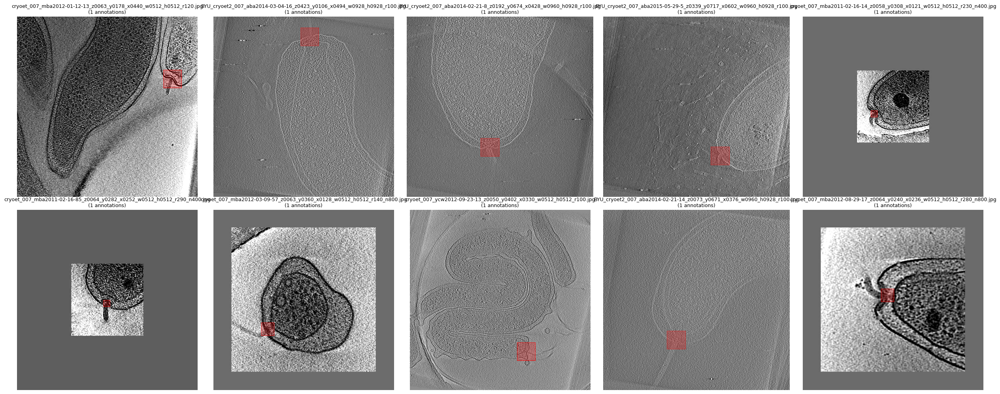

cryoet_007_mba2012-01-12-13_z0063_y0178_x0440_w0512_h0512_r120.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_010_cleaned\train\cryoet_007_mba2012-01-12-13_z0063_y0178_x0440_w0512_h0512_r120.txt
BYU_cryoet2_007_aba2014-03-04-16_z0423_y0106_x0494_w0928_h0928_r100.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_010_cleaned\train\BYU_cryoet2_007_aba2014-03-04-16_z0423_y0106_x0494_w0928_h0928_r100.txt
BYU_cryoet2_007_aba2014-02-21-8_z0192_y0674_x0428_w0960_h0928_r100.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_010_cleaned\train\BYU_cryoet2_007_aba2014-02-21-8_z0192_y0674_x0428_w0960_h0928_r100.txt
BYU_cryoet2_007_aba2015-05-29-5_z0339_y0717_x0602_w0960_h0928_r100.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_010_cleaned\train\BYU_cryoet2_007_aba2015-05-29-5_z0339_y0717_x0602_w0960_h0928_r100.txt
cryoet_007_mba2011-02-16-14_z0058_y0308_x0121_w0512_h0512_r230_n400.jpg
C:\Users\Freedomkwok2022\ML_Learn\

In [195]:
# # Run the visualization
images_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\images\shared_010_cleaned\train")
labels_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_010_cleaned\train")
visualize_random_training_samples(images_dir, labels_dir, 10, 2)

## Dynamic Dataset///might need change

In [31]:
import os
import shutil
import glob
import re
import random

# === Paths ===
labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"
images_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train"
base_dst = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset"

# === Ensure destination folders exist ===
for split in ["train", "val"]:
    os.makedirs(os.path.join(base_dst, f"labels/shared_dyn/{split}"), exist_ok=True)
    os.makedirs(os.path.join(base_dst, f"images/shared_dyn/{split}"), exist_ok=True)

# === rXXX mapping logic ===
def map_group(original_r):
    r_val = int(original_r)
    if 70 <= r_val <= 100:
        return "090", "0.09"
    elif 110 <= r_val <= 160:
        return "140", "0.14"
    elif 170 <= r_val <= 260:
        return "230", "0.23"
    elif 270 <= r_val <= 440:
        return "340", "0.34"
    return None, None

# === Collect valid entries ===
r_pattern = re.compile(r"_r(\d{3})\.txt$")
entries = []

for label_path in glob.glob(os.path.join(labels_src, "*.txt")):
    base = os.path.basename(label_path)
    match = r_pattern.search(base)
    if not match:
        continue

    original_r = match.group(1)
    new_r, new_wh = map_group(original_r)
    if not new_r:
        continue

    # New filenames with rNEW_oOLD format
    new_base_name = base.replace(f"_r{original_r}.txt", f"_r{new_r}_o{original_r}.txt")
    new_image_name = new_base_name.replace(".txt", ".jpg")
    original_image_name = base.replace(".txt", ".jpg")

    image_src_path = os.path.join(images_src, original_image_name)
    if os.path.exists(image_src_path):
        entries.append({
            "label_src": label_path,
            "image_src": image_src_path,
            "label_dst_name": new_base_name,
            "image_dst_name": new_image_name,
            "wh_value": new_wh,
        })

# === Train/Val split ===
random.shuffle(entries)
split_idx = int(len(entries) * 0.97)
train_entries = entries[:split_idx]
val_entries = entries[split_idx:]

print(f"Total: {len(entries)} | Train: {len(train_entries)} | Val: {len(val_entries)}")

# === Copy function ===
def copy_and_rewrite(entry, split):
    label_dst = os.path.join(base_dst, f"labels/shared_dyn/{split}", entry["label_dst_name"])
    image_dst = os.path.join(base_dst, f"images/shared_dyn/{split}", entry["image_dst_name"])

    # Rewrite label with updated width/height
    with open(entry["label_src"], "r") as f:
        lines = f.readlines()

    updated = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 5:
            parts[3], parts[4] = entry["wh_value"], entry["wh_value"]
            updated.append(" ".join(parts))
        else:
            updated.append(line.strip())

    with open(label_dst, "w") as f:
        f.write("\n".join(updated) + "\n")

    shutil.copy2(entry["image_src"], image_dst)

# === Execute copy for both splits ===
for e in train_entries:
    copy_and_rewrite(e, "train")

for e in val_entries:
    copy_and_rewrite(e, "val")


Total: 7187 | Train: 6971 | Val: 216


In [36]:
import os
import glob
import re
from collections import Counter

labels_src =  Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_dyn\train")

# Match all .txt label files
label_files = glob.glob(os.path.join(labels_src, "*.txt"))

# Extract rXXXX values using regex
r_pattern = re.compile(r'_r(\d{3})\.txt$')
r_counts = Counter()

for filepath in label_files:
    filename = os.path.basename(filepath)
    match = r_pattern.search(filename)
    if match:
        r_value = f"r{match.group(1)}"
        r_counts[r_value] += 1

# Print summary
print("Found the following RXXXX types in shared_009:")
for r_value, count in sorted(r_counts.items()):
    print(f"{r_value}: {count} files")


Found the following RXXXX types in shared_009:


#### new dynamic ratio based on 612x612

In [190]:
# Paths
labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"
images_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train"
base_dst = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset"

# Destination folders
labels_dst_train = os.path.join(base_dst, r"labels\shared_010_cleaned\train")
images_dst_train = os.path.join(base_dst, r"images\shared_010_cleaned\train")
labels_dst_val = os.path.join(base_dst, r"labels\shared_010_cleaned\val")
images_dst_val = os.path.join(base_dst, r"images\shared_010_cleaned\val")

import re

# Zoom scales and target size
zoomout_scales = [0.80, 0.567, 0.40, 0.28]
target_size = 640  # final model training image size
# Get all label files
all_label_files = glob.glob(os.path.join(labels_src, "*.txt"))

# Filter files where the 'rXXX' suffix is >= 130
matched_labels = []
for label_path in all_label_files:
    filename = os.path.basename(label_path)
    match = re.search(r"r(\d+)\.txt$", filename)
    if match and int(match.group(1)) >= 130:
        matched_labels.append(label_path)

#matched_labels = matched_labels[:100]
# Shuffle and split
random.shuffle(matched_labels)
split_idx = int(len(matched_labels) * 0.97)
train_labels = matched_labels[:split_idx]
val_labels = matched_labels[split_idx:]

# Helper to extract rXXX from filename
def extract_r_value(filename: str) -> int:
    match = re.search(r"r(\d+)\.txt$", filename)
    return int(match.group(1)) if match else -1

def closest_scale_ratios(width, height, zoomout_scales=zoomout_scales, target_size=target_size):
    scale_needed = target_size / max(width, height)
    
    # Sort zoomout scales by how close they are to the desired scale
    sorted_scales = sorted(zoomout_scales, key=lambda z: abs(z - scale_needed))
    closest = sorted_scales[0]
    
    # Find index of the closest scale in the original list (preserving order)
    index = zoomout_scales.index(closest)
    
    # Return closest and two more to the right (i.e., smaller scales)
    return zoomout_scales[index:index+3]

def process_file(label_path, is_train=True):
    label_file = os.path.basename(label_path)
    base_r = extract_r_value(label_file)
    base_name = label_file.replace(f"r{base_r}.txt", "")
    image_file = base_name + f"r{base_r}.jpg"
    img_path = os.path.join(images_src, image_file)
    
    if not os.path.exists(img_path):
        print(f"[Missing image] {img_path}")
        return

    labels_dst = labels_dst_train if is_train else labels_dst_val
    images_dst = images_dst_train if is_train else images_dst_val

    base_img = Image.open(img_path).convert("L")
    img_w, img_h = base_img.size
    
    with open(label_path, 'r') as f:
        lines = [line.strip().split() for line in f if len(line.strip().split()) == 5]
        original_boxes = [list(map(float, line)) for line in lines]

    for zoom in closest_scale_ratios(img_w, img_h):
        zoomed_img = fast_zoom_out(base_img, zoom)
        resized_img = zoomed_img.resize((target_size, target_size), Image.BICUBIC)

        zoomed_w, zoomed_h = zoomed_img.size
        ratio_x = target_size / zoomed_w
        ratio_y = target_size / zoomed_h

        updated_lines = []
        for class_id, x_c, y_c, box_w, box_h in original_boxes:
            xc_pix = x_c * img_w * zoom
            yc_pix = y_c * img_h * zoom
            bw_pix = box_w * img_w * zoom
            bh_pix = box_h * img_h * zoom

            xc_new = (xc_pix + (img_w - img_w * zoom) / 2) * ratio_x / target_size
            yc_new = (yc_pix + (img_h - img_h * zoom) / 2) * ratio_y / target_size
            bw_new = bw_pix * ratio_x / target_size
            bh_new = bh_pix * ratio_y / target_size

            updated_lines.append(f"{int(class_id)} {xc_new:.6f} {yc_new:.6f} {bw_new:.6f} {bh_new:.6f}")

        zoom_int = int(round(zoom * 1000))  # e.g. 0.567 → 567
        new_base = f"{base_name}r{base_r:03d}_n{zoom_int:03d}"
        new_label_path = os.path.join(labels_dst, f"{new_base}.txt")
        new_image_path = os.path.join(images_dst, f"{new_base}.jpg")

        os.makedirs(os.path.dirname(new_label_path), exist_ok=True)
        os.makedirs(os.path.dirname(new_image_path), exist_ok=True)

        with open(new_label_path, 'w') as f:
            f.write("\n".join(updated_lines) + "\n")

        resized_img.convert("L").save(new_image_path)
    
# Process all
for label in train_labels:
    process_file(label, is_train=True)

for label in val_labels:
    process_file(label, is_train=False)

In [ ]:
# # Run the visualization
images_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\images\shared_dyn\train")
labels_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_dyn\train")
visualize_random_training_samples(images_dir, labels_dir, 10, 2)

In [186]:
import os
from pathlib import Path

images_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\images\shared_010_cleaned\train")
labels_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_010_cleaned\train")

# Get base names without extensions
image_files = {f.stem for f in images_dir.glob("*.jpg")}
label_files = {f.stem for f in labels_dir.glob("*.txt")}

# Find mismatches
images_without_labels = image_files - label_files
labels_without_images = label_files - image_files

# Print results
print(f"Total Image {len(image_files)}")
print(f"=== Images without corresponding labels {len(images_without_labels)}===")
for stem in sorted(images_without_labels):
    print(images_dir / f"{stem}.jpg")

print(f"\n=== Labels without corresponding images {len(labels_without_images)}===")
for stem in sorted(labels_without_images):
    print(labels_dir / f"{stem}.txt")

Total Image 291
=== Images without corresponding labels 0===

=== Labels without corresponding images 0===


### Eval the Multi Scal Image

In [187]:
import os
import glob

def load_predictions_from_folder(label_folder, image_folder, pattern="*_r130*.txt"):
    predicted_annotations = {}

    label_files = glob.glob(os.path.join(label_folder, pattern))

    for label_path in label_files:
        basename = os.path.basename(label_path)
        image_filename  = os.path.splitext(basename)[0] + ".jpg"  # image filename to match
        image_path = os.path.join(image_folder, image_filename)
        
        try:
            with open(label_path, 'r') as f:
                lines = f.readlines()
                annotations = []
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        class_id, x_c, y_c, w, h = map(float, parts)
                        annotations.append({
                            'class_id': int(class_id),
                            'x_center': x_c,
                            'y_center': y_c,
                            'width': w,
                            'height': h,
                            'conf': None,
                            'predicted': False,
                            'zoom_scale': 1.0  # or None if unknown
                        })
                predicted_annotations[image_path] = annotations

        except Exception as e:
            print(f"❌ Error reading {label_path}: {e}")

    return predicted_annotations

# Example usage
labels_dir = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_010_cleaned\train"
images_dir = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\images\shared_010_cleaned\train"

predicted_annotations = load_predictions_from_folder(labels_dir, images_dir)
print("Loaded predictions for", len(predicted_annotations), "images")


Loaded predictions for 18 images


### check resize result

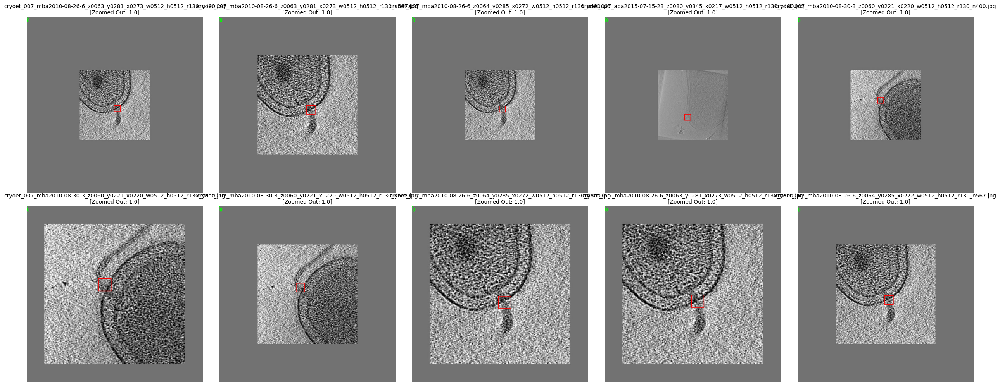

In [189]:
display_predictions_vs_labels(predicted_annotations, 10, 2)

In [ ]:
import os
import shutil
from glob import glob

# Source directories
source_dirs = [
    "/workspace/BYU/notebooks/yolo_dataset/images/shared_009/",
    "/workspace/BYU/notebooks/yolo_dataset/images/shared_009_cleaned/"
]

# Destination directories
merged_image_dir = "/workspace/BYU/notebooks/yolo_dataset/images/shared_009_merged/"
merged_label_dir = merged_image_dir.replace("images", "labels")

# Ensure destination directories exist
os.makedirs(merged_image_dir, exist_ok=True)
os.makedirs(merged_label_dir, exist_ok=True)

# File copy loop
for source in source_dirs:
    image_paths = glob(os.path.join(source, "*.jpg"))
    for img_path in image_paths:
        basename = os.path.basename(img_path)
        label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")

        # Copy image
        shutil.copy(img_path, os.path.join(merged_image_dir, basename))

        # Copy label if it exists
        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(merged_label_dir, os.path.basename(label_path)))
        else:
            print(f"Warning: Label not found for {basename}")

print("✅ Merging complete.")


In [ ]:
import os
from pathlib import Path

images_dir = Path(r"/workspace/BYU/notebooks/yolo_dataset/images/shared_009_merged/train")
labels_dir = Path(r"/workspace/BYU/notebooks/yolo_dataset/labels/shared_009_merged/train")

# Get base names without extensions
image_files = {f.stem for f in images_dir.glob("*.jpg")}
label_files = {f.stem for f in labels_dir.glob("*.txt")}

# Find mismatches
images_without_labels = image_files - label_files
labels_without_images = label_files - image_files

# Print results
print(f"Total Image {len(image_files)}")
print(f"=== Images without corresponding labels {len(images_without_labels)}===")
for stem in sorted(images_without_labels):
    print(images_dir / f"{stem}.jpg")

print(f"\n=== Labels without corresponding images {len(labels_without_images)}===")
for stem in sorted(labels_without_images):
    print(labels_dir / f"{stem}.txt")

In [ ]:
import os
from pathlib import Path

image_root = Path("/workspace/BYU/notebooks/yolo_dataset/images/shared_009_merged")
label_root = Path("/workspace/BYU/notebooks/yolo_dataset/labels/shared_009_merged")

# Collect all image and label stems across both train and val
image_files = {f.stem: f for f in image_root.rglob("*.jpg")}
label_files = {f.stem: f for f in label_root.rglob("*.txt")}

# Find mismatches
image_stems = set(image_files.keys())
label_stems = set(label_files.keys())

images_without_labels = image_stems - label_stems
labels_without_images = label_stems - image_stems

# Report
print(f"Total Images: {len(image_stems)}")
print(f"Total Labels: {len(label_stems)}")

print(f"\n=== Images without corresponding labels ({len(images_without_labels)}) ===")
for stem in sorted(images_without_labels):
    print(image_files[stem])

print(f"\n=== Labels without corresponding images ({len(labels_without_images)}) ===")
for stem in sorted(labels_without_images):
    print(label_files[stem])


### Image Predict with Zoom

In [13]:
import os
from ultralytics import YOLO
local_dev =  "/workspace/BYU/notebooks" if "WANDB_API_KEY" in os.environ else "C:/Users/Freedomkwok2022/ML_Learn/BYU/notebooks"
yolo_dataset_dir = os.path.join(local_dev, 'yolo_dataset')
yolo_weights_dir = os.path.join(local_dev, 'yolo_weights')

In [ ]:
from torchinfo import summary
model_009_merge_159 = os.path.join(yolo_weights_dir, "3_yolo11s_shared_009_cleaned_248_80", "weights", "best.pt")
model = YOLO(model_009_merge_159)

# len(image_list):  526

# ✅ Predictable: 358
# ❌ Unpredictable: 168

# 📊 Prediction counts by zoom scale:
#   Zoom original: 358 images
# Total works: 358

# len(image_list):  168

# ✅ Predictable: 96
# ❌ Unpredictable: 72

# 📊 Prediction counts by zoom scale:
#   Zoom     0.45: 28 images
#   Zoom     0.40: 8 images
#   Zoom     0.35: 10 images
#   Zoom     0.30: 5 images
#   Zoom     0.25: 6 images
#   Zoom     0.22: 3 images
#   Zoom     0.20: 8 images
#   Zoom original: 28 images
# Total works: 96


In [139]:
model_009_merge_159 = os.path.join(yolo_weights_dir, "motor_detector_shared_009_optuna_trial_147", "weights", "best.pt")
model = YOLO(model_009_merge_159)
from torchinfo import summary
# summary(model.model, input_size=(1, 3, 640, 640), depth=5, verbose=1)
# len(image_list):  526

# ✅ Predictable: 289
# ❌ Unpredictable: 237

# 📊 Prediction counts by zoom scale:
#   Zoom original: 289 images
# Total works: 289

# len(image_list):  237

# ✅ Predictable: 168
# ❌ Unpredictable: 69

# 📊 Prediction counts by zoom scale:
#   Zoom     0.45: 113 images
#   Zoom     0.40: 8 images
#   Zoom     0.35: 9 images
#   Zoom     0.30: 4 images
#   Zoom     0.22: 2 images
#   Zoom original: 32 images
# Total works: 168


### predict with Zoomout func

In [146]:
def run_yolo_predictions(model, image_list, predicted_annotations, conf_threshold=0.5, zoomout_scales=None):
    print("len(image_list): ", len(image_list))
    predictable = []
    unpredictable = []
    zoom_stats = defaultdict(int)
    
    for img_path in image_list:
        try:
            img = Image.open(img_path).convert("RGB")
            success = False

            # Try original image if no zoom-out strategy or as the first attempt
            all_versions = [("original", img)]
            if zoomout_scales:
                for z in zoomout_scales:
                    all_versions.append((z, fast_zoom_out(img, z)))

            for zoom_id, image_version in all_versions:
                results = model.predict(source=image_version, save=False, verbose=False, conf=conf_threshold)
                boxes = results[0].boxes

                if boxes is not None and len(boxes) > 0:
                    img_width, img_height = img.size
                    predicted_annotations[img_path] = []
                    for box in boxes:
                        x1, y1, x2, y2 = box.xyxy[0].tolist()
                        class_id = int(box.cls[0].item())
                        conf = float(box.conf[0].item()) if box.conf is not None else 0.0
                        predicted_annotations[img_path].append({
                            'class_id': class_id,
                            'x_center': (x1 + x2) / 2,
                            'y_center': (y1 + y2) / 2,
                            'width': x2 - x1,
                            'height': y2 - y1,
                            'conf': conf,
                            'predicted': True,
                            'zoom_scale': zoom_id if zoom_id != "original" else None
                        })
                    predictable.append(img_path)
                    zoom_stats[str(zoom_id)] += 1
                    success = True
                    break  # Stop after first successful detection

            if not success:
                unpredictable.append(img_path)

        except Exception as e:
            print(f"❌ Error processing {img_path}: {e}")
            unpredictable.append(img_path)

    print(f"\n✅ Predictable: {len(predictable)}")
    print(f"❌ Unpredictable: {len(unpredictable)}")
    print("\n📊 Prediction counts by zoom scale:")
    
    for k in sorted(zoom_stats, key=lambda x: float('inf') if x == "original" else -float(x)):
        label = f"{float(k):.2f}" if k != "original" else k
        print(f"  Zoom {label:>8}: {zoom_stats[k]} images")
    print("Total works:", sum(zoom_stats.values()))

    return predictable, unpredictable, zoom_stats


import os
import random
import math
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from PIL import ImageFont

font = None
try:
    font = ImageFont.truetype("arialbd.ttf", size=20)  # Arial Bold
except:
    font = ImageFont.truetype("DejaVuSans-Bold.ttf", size=20)  # Fallback for most systems

from collections import defaultdict

def summarize_prediction_scales(predicted_annotations):
    scale_counts = defaultdict(int)

    for img_path, boxes in predicted_annotations.items():
        # Get the zoom scale for this image (if any)
        zoom_scale = next((b.get('zoom_scale') for b in boxes if 'zoom_scale' in b), None)
        if zoom_scale is None:
            zoom_scale = 'original'
        scale_counts[zoom_scale] += 1

    print("\n📊 Prediction count by zoom scale:")
    for scale in sorted(scale_counts, key=lambda x: (float('inf') if x == 'original' else -x)):
        label = f"{scale:.2f}" if isinstance(scale, float) else scale
        print(f"  Zoom {label:>7}: {scale_counts[scale]} images")

    print(f"\n🧮 Total predicted images: {sum(scale_counts.values())}")
    
def display_predictions_vs_labels(predicted_annotations, sample_size=6, rows=2):
    selected_images = random.sample(list(predicted_annotations.keys()), min(sample_size, len(predicted_annotations)))
    cols = math.ceil(len(selected_images) / rows)
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = axes.flatten()

    try:
        font = ImageFont.truetype("arialbd.ttf", size=20)
    except:
        font = ImageFont.truetype("DejaVuSans-Bold.ttf", size=20)

    for ax, img_path in zip(axes, selected_images):
        try:
            # Determine zoom scale if used
            zoom_scale = next((b.get('zoom_scale') for b in predicted_annotations[img_path] if b.get('zoom_scale')), None)

            # Open original image
            base_img = Image.open(img_path).convert("RGB")

            # Apply zoom if needed
            if zoom_scale:
                img = fast_zoom_out(base_img, zoom_scale)
            else:
                img = base_img

            w, h = img.size
            overlay = Image.new('RGBA', img.size)
            draw = ImageDraw.Draw(overlay)

            # Load GT label using original image size
            label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")
            if os.path.exists(label_path):
                orig_w, orig_h = base_img.size
                zoom_ratio = zoom_scale if zoom_scale else 1.0

                # Compute padding added by fast_zoom_out
                scaled_w, scaled_h = int(orig_w * zoom_ratio), int(orig_h * zoom_ratio)
                pad_left = (orig_w - scaled_w) // 2
                pad_top = (orig_h - scaled_h) // 2

                with open(label_path, 'r') as f:
                    for line in f:
                        class_id, x_c, y_c, box_w, box_h = map(float, line.strip().split())

                        # Original coordinates
                        xc = x_c * orig_w
                        yc = y_c * orig_h
                        bw = box_w * orig_w
                        bh = box_h * orig_h

                        # Apply zoom and pad offsets
                        xc = xc * zoom_ratio + pad_left
                        yc = yc * zoom_ratio + pad_top
                        bw *= zoom_ratio
                        bh *= zoom_ratio

                        x1 = int(xc - bw / 2)
                        y1 = int(yc - bh / 2)
                        x2 = int(xc + bw / 2)
                        y2 = int(yc + bh / 2)

                        draw.rectangle([x1, y1, x2, y2], outline=(255, 0, 0, 255), width=2)


            # Draw predicted boxes (coordinates already in pixels for zoomed image)
            for box in predicted_annotations[img_path]:
                xc, yc = box['x_center'], box['y_center']
                bw, bh = box['width'], box['height']
                x1, y1 = int(xc - bw / 2), int(yc - bh / 2)
                x2, y2 = int(xc + bw / 2), int(yc + bh / 2)
                draw.rectangle([x1, y1, x2, y2], outline=(0, 255, 0, 255), width=2)

                conf = box.get('conf', None)
                label = f"{box['class_id']}"
                if conf is not None:
                    label += f" ({conf:.2f})"
                draw.text((x1, max(0, y1 - 20)), label, fill=(0, 255, 0, 255), font=font)

            title = os.path.basename(img_path)
            if zoom_scale:
                title += f"\n[Zoomed Out: {zoom_scale}]"

            ax.imshow(Image.alpha_composite(img.convert("RGBA"), overlay).convert("RGB"))
            ax.set_title(title, fontsize=10)
            ax.axis("off")

        except Exception as e:
            print(f"Error displaying {img_path}: {e}")
            ax.axis("off")

    plt.tight_layout()
    plt.show()
    
def filter_by_zoom_scales(predicted_dict, zoomout_scales):
    zoom_set = set(zoomout_scales)
    return {
        img_path: boxes
        for img_path, boxes in predicted_dict.items()
        if any(box.get('zoom_scale') in zoom_set for box in boxes)
    }
    
zoomout_scales=[0.80, 0.567, 0.40, 0.28]

In [147]:
first_round_predictable = {}  
_, first_round_unpredict, _ = run_yolo_predictions(model, test_images, first_round_predictable, conf_threshold = 0.5)

len(image_list):  526

✅ Predictable: 289
❌ Unpredictable: 237

📊 Prediction counts by zoom scale:
  Zoom original: 289 images
Total works: 289


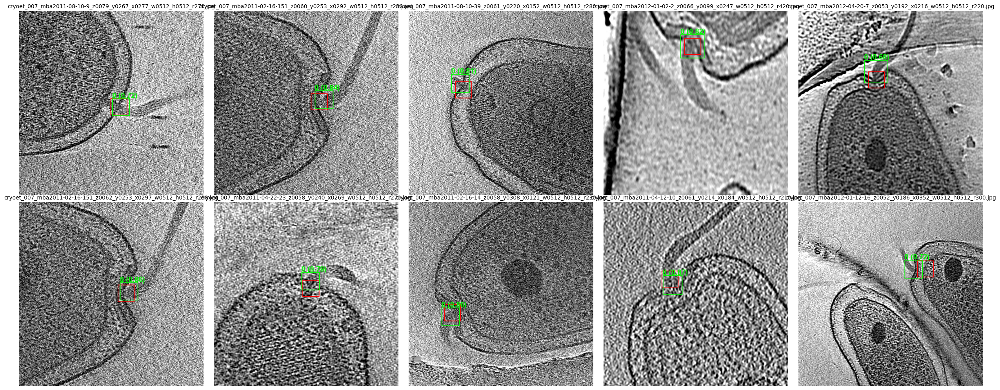

In [148]:
display_predictions_vs_labels(first_round_predictable, 10, 2)

In [149]:
second_round_predictable = {}  
_, second_round_unpredict, _ = run_yolo_predictions(model, first_round_unpredict, second_round_predictable, conf_threshold=0.5, zoomout_scales=zoomout_scales)

len(image_list):  237

✅ Predictable: 172
❌ Unpredictable: 65

📊 Prediction counts by zoom scale:
  Zoom     0.80: 59 images
  Zoom     0.57: 75 images
  Zoom     0.40: 24 images
  Zoom     0.28: 14 images
Total works: 172


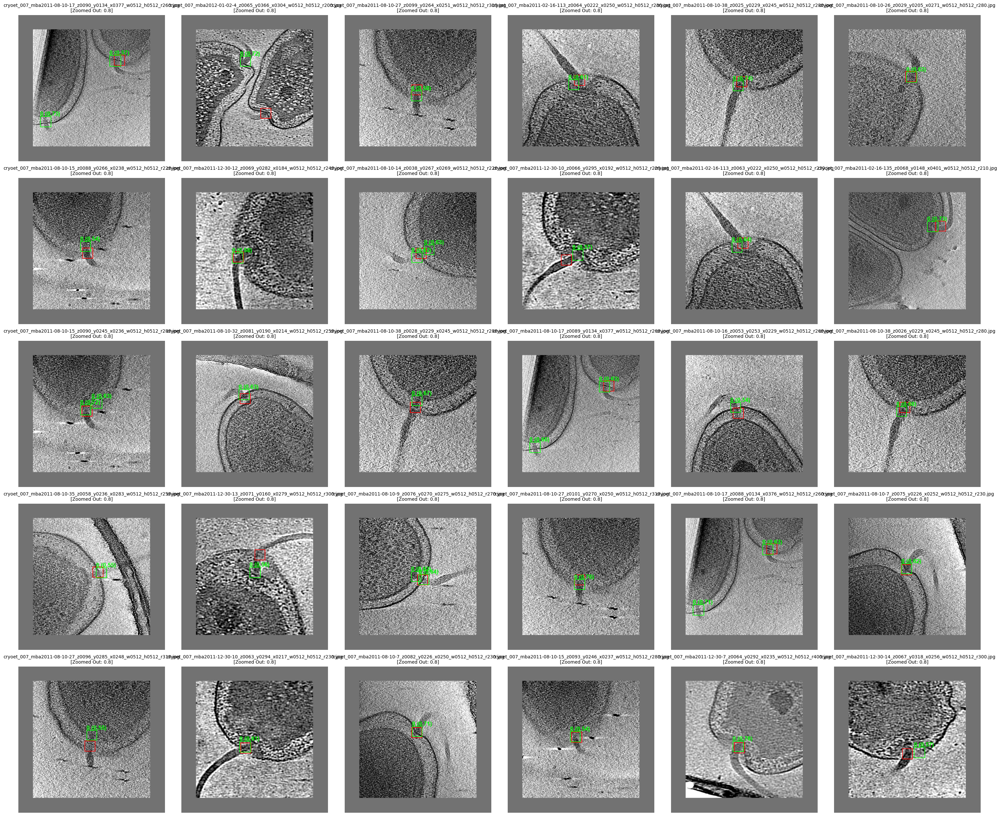

In [150]:
targets = filter_by_zoom_scales(second_round_predictable, zoomout_scales=zoomout_scales[:1])
display_predictions_vs_labels(targets, 30, 5)

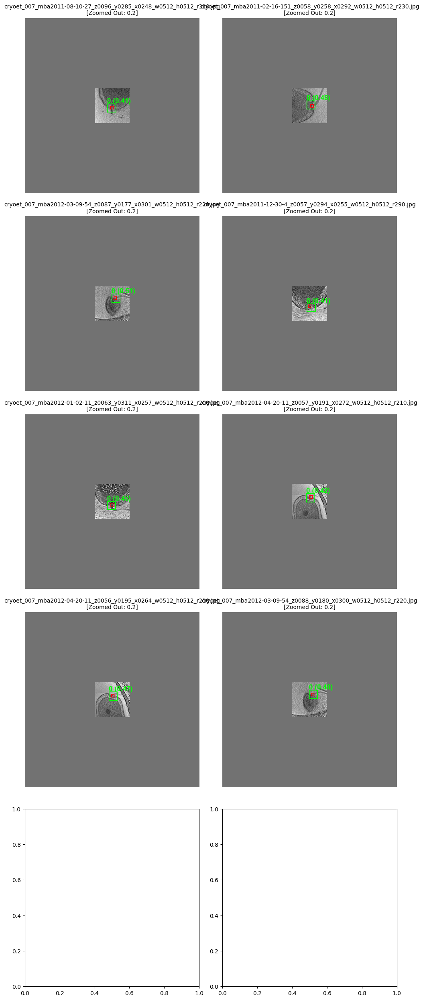

In [138]:
targets = filter_by_zoom_scales(second_round_predictable, zoomout_scales=zoomout_scales[-1:])
display_predictions_vs_labels(targets, 30, 5)

In [ ]:
targets = filter_by_zoom_scales(second_round_predictable, zoomout_scales=[0.3])
display_predictions_vs_labels(targets, 30, 5)